# Connect to Root Folder

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [7]:
cd "/content/gdrive/MyDrive/CS114-Minh thuận"


/content/gdrive/MyDrive/CS114-Minh thuận


# Import Library

In [2]:
import numpy as np
import pandas as pd
import sys
import os
from keras.layers import *
from keras.optimizers import *
from keras.applications import *
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras import backend as k
import matplotlib.pyplot as plt
from keras.models import load_model 
import keras.utils as image 
import cv2
from google.colab.patches import cv2_imshow
import keras

# Load Data

**Dataset original**

In [11]:
train_datagen = ImageDataGenerator(rescale=1. / 255, validation_split=0.1)
test_datagen = ImageDataGenerator(rescale=1. / 255)

In [12]:
# load and iterate training dataset has process
train_it_original = train_datagen.flow_from_directory("Data/Split Original/train", 
                                       target_size=(224,224), 
                                       color_mode='rgb', 
                                       class_mode="categorical",
                                       batch_size=32,
                                       subset = "training")

# Validation Data has process
val_it_original = train_datagen.flow_from_directory("Data/Split Original/train",
                                     target_size=(224,224),
                                     color_mode='rgb',
                                     class_mode="categorical",
                                     batch_size=32,
                                     subset='validation')

# load and iterate test dataset has process
test_it_original = test_datagen.flow_from_directory("Data/Split Original/test", 
                                      target_size=(224,224), 
                                      color_mode='rgb', 
                                      class_mode="categorical")

Found 1728 images belonging to 16 classes.
Found 192 images belonging to 16 classes.
Found 1280 images belonging to 16 classes.


**Dataset preprocess**

In [16]:
# load and iterate training dataset has process
train_it_preprocess = train_datagen.flow_from_directory("Data/Split PreProcessing/train", 
                                       target_size=(224,224), 
                                       color_mode='rgb', 
                                       class_mode="categorical",
                                       batch_size=32,
                                       subset = "training")

# Validation Data has process
val_it_preprocess = train_datagen.flow_from_directory("Data/Split PreProcessing/train",
                                     target_size=(224,224),
                                     color_mode='rgb',
                                     class_mode="categorical",
                                     batch_size=32,
                                     subset='validation')

# load and iterate test dataset has process
test_it_preprocess = test_datagen.flow_from_directory("Data/Split PreProcessing/test", 
                                      target_size=(224,224), 
                                      color_mode='rgb', 
                                      class_mode="categorical")

Found 17280 images belonging to 16 classes.
Found 1920 images belonging to 16 classes.
Found 12800 images belonging to 16 classes.


# VGG16 with original data

## Train model

**Load pre-train model**

In [ ]:
from tensorflow import keras

base_model = keras.applications.VGG16(
    weights='imagenet',
    input_shape=(224, 224, 3),
    include_top=False)

In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
# Keep the learned features intact and not modify them while training the new layers that were added on top of them
base_model.trainable = False

In [ ]:
# Create inputs with correct shape
inputs = Input(shape=(224, 224, 3))

x = base_model(inputs, training=False)

# Add pooling layer or flatten layer
x = Flatten()(x)

# Add a hidden layer
x = Dense(256, activation='relu')(x)

# Add a dropout layer
x = Dropout(.5)(x)

# Add final dense layer
outputs = Dense(16, activation = 'softmax')(x)

# Combine inputs and outputs to create model
model = Model(inputs, outputs)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 16)                4112      
                                                                 
Total params: 21,141,584
Trainable params: 6,426,896
Non-trai

In [ ]:
model.compile(loss='categorical_crossentropy',
              metrics=["accuracy"],
             optimizer = 'nadam')

In [ ]:
history = model.fit_generator(generator = train_it_original,
                              steps_per_epoch=train_it_original.samples/train_it_original.batch_size,
                              epochs=20,
                              validation_data=val_it_original,
                              validation_steps=val_it_original.samples/val_it_original.batch_size,
)

<ipython-input-19-6033749c5954>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator = train_it_original,


Epoch 1/20
54/54 [==============================] - 794s 15s/step - loss: 2.1131 - accuracy: 0.3779 - val_loss: 1.1285 - val_accuracy: 0.6510
Epoch 2/20
54/54 [==============================] - 157s 3s/step - loss: 1.0248 - accuracy: 0.6649 - val_loss: 0.7197 - val_accuracy: 0.8177
Epoch 3/20
54/54 [==============================] - 156s 3s/step - loss: 0.7219 - accuracy: 0.7749 - val_loss: 0.5217 - val_accuracy: 0.8542
Epoch 4/20
54/54 [==============================] - 157s 3s/step - loss: 0.5105 - accuracy: 0.8380 - val_loss: 0.4226 - val_accuracy: 0.8594
Epoch 5/20
54/54 [==============================] - 157s 3s/step - loss: 0.4853 - accuracy: 0.8397 - val_loss: 0.3973 - val_accuracy: 0.8698
Epoch 6/20
54/54 [==============================] - 157s 3s/step - loss: 0.3904 - accuracy: 0.8738 - val_loss: 0.3556 - val_accuracy: 0.8698
Epoch 7/20
54/54 [==============================] - 156s 3s/step - loss: 0.3192 - accuracy: 0.8987 - val_loss: 0.3504 - val_accuracy: 0.8750
Epoch 8/20
5

**Save Model**

In [ ]:
model.save('fruit_classifier_VGG16_original.h5')

## Evaluate Model

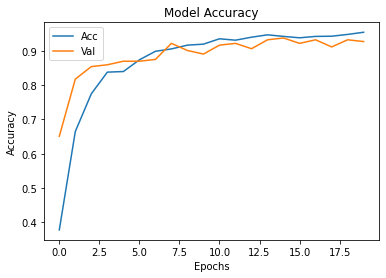

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'upper left')

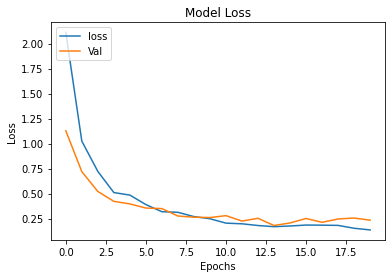

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper left')

In [44]:
test_path = "Data/Split Original/test"
labels = os.listdir(test_path)
label_map = dict((v,k) for k,v in test_it_original.class_indices.items()) 
lst_imgs = {'img': [],'true': [], 'predict': []}

for label in labels:
  img_path = os.path.join(test_path,label)
  for img_name in os.listdir(img_path):

    # Load the image to be predicted
    img = image.load_img(os.path.join(img_path,img_name), target_size=(224, 224),color_mode = 'rgb')

    # Convert the image to a numpy array
    img_array = image.img_to_array(img)

    # Preprocess the image (normalize pixel values and expand dimensions to match input shape)
    img_preprocessed = np.expand_dims(img_array / 255.0, axis=0)

    predict = model.predict(img_preprocessed,verbose = 0)
    predict = label_map[np.argmax(predict)]
    lst_imgs['img'].append(img)
    lst_imgs['true'].append(label)
    lst_imgs['predict'].append(predict)


In [45]:
from sklearn.metrics import classification_report
lst_label = list(label_map.values())

clr_table = classification_report(lst_imgs['true'], lst_imgs['predict'], labels = lst_label)
print(clr_table)

                   precision    recall  f1-score   support

       FreshApple       0.90      0.95      0.93        80
      FreshBanana       0.98      0.99      0.98        80
       FreshGrape       0.88      0.96      0.92        80
       FreshGuava       1.00      0.99      0.99        80
      FreshJujube       0.91      0.93      0.92        80
      FreshOrange       0.91      0.93      0.92        80
 FreshPomegranate       0.92      0.97      0.95        80
  FreshStrawberry       1.00      1.00      1.00        80
      RottenApple       0.88      0.89      0.88        80
     RottenBanana       0.99      0.95      0.97        80
      RottenGrape       0.97      0.82      0.89        80
      RottenGuava       0.87      0.94      0.90        80
     RottenJujube       0.88      0.86      0.87        80
     RottenOrange       0.91      0.90      0.91        80
RottenPomegranate       0.91      0.80      0.85        80
 RottenStrawberry       0.95      0.97      0.96       

**Show some True predict and False Predict**

In [56]:
imgs = np.array(lst_imgs['img'])
y_predict = np.array(lst_imgs['predict'])
y_true = np.array(lst_imgs['true'])

<ipython-input-56-e2d7e8e55382>:1: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  imgs = np.array(lst_imgs['img'])
<ipython-input-56-e2d7e8e55382>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  imgs = np.array(lst_imgs['img'])


In [76]:
true_predict_img = imgs[y_predict == y_true]
true_predict_label = y_true[y_predict == y_true]
false_predict_img = imgs[~(y_predict == y_true)]
false_predict_label = y_predict[~(y_predict == y_true)]
true_false_predict_label = y_true[~(y_predict == y_true)]

**True Predict**

In [108]:
labels = [label for label in lst_label]
list_true_categorical = []
list_predict_categorical = []
for label in labels:
  true_categorical = true_predict_img[true_predict_label == label]
  predict_categorical = true_predict_label[true_predict_label == label]

  list_true_categorical.append(true_categorical)
  list_predict_categorical.append(predict_categorical)

FreshApple


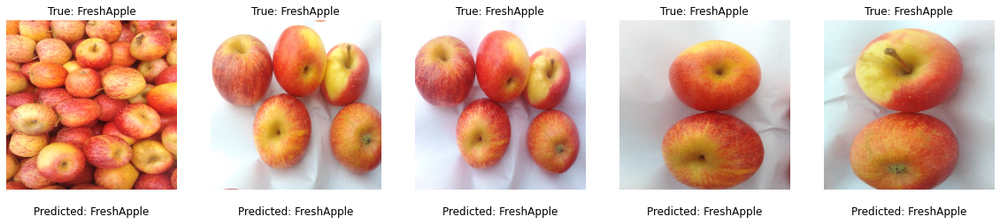

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshBanana


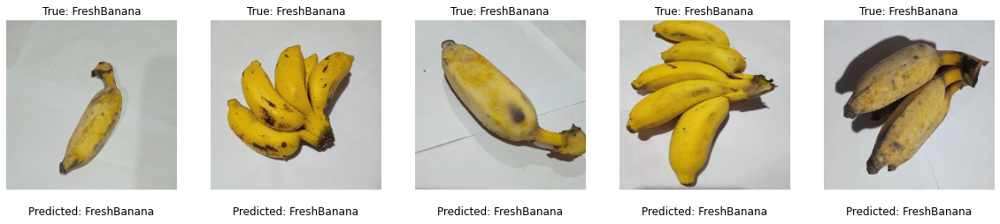

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGrape


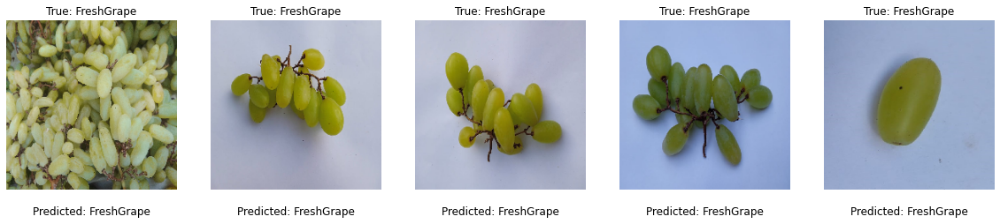

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGuava


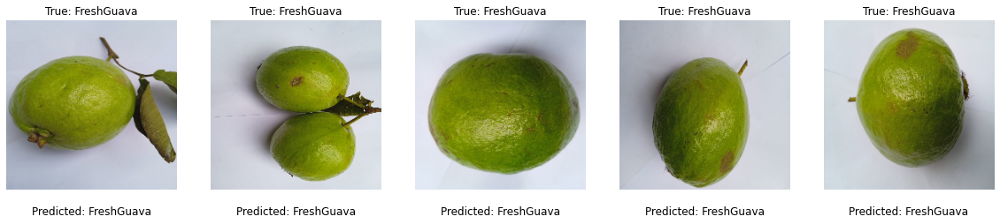

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshJujube


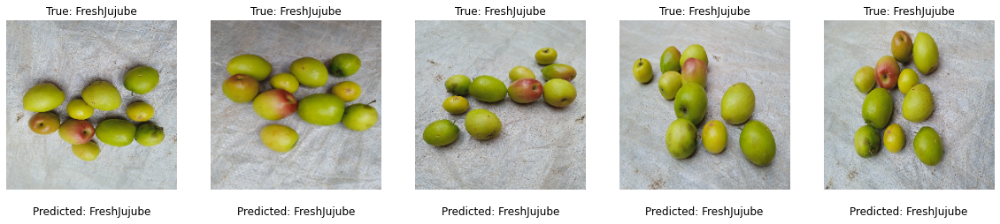

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshOrange


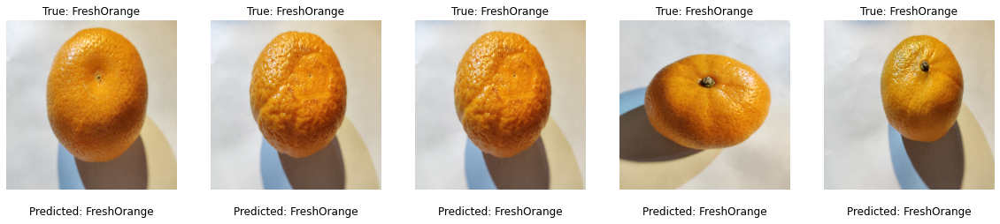

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshPomegranate


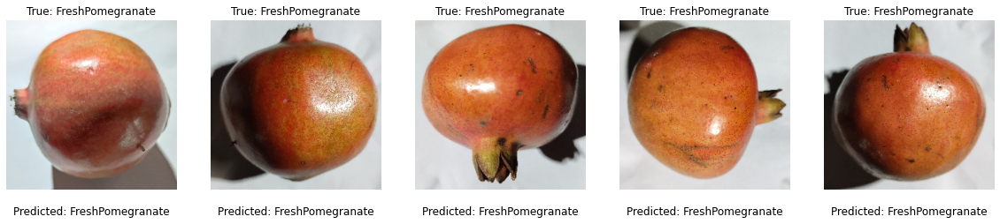

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshStrawberry


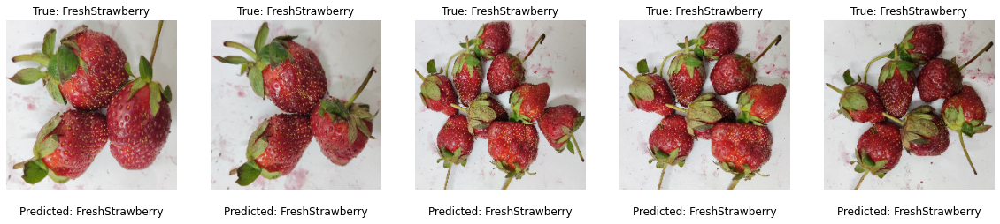

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenApple


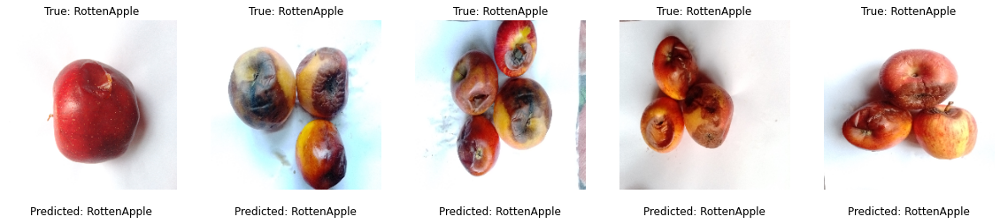

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenBanana


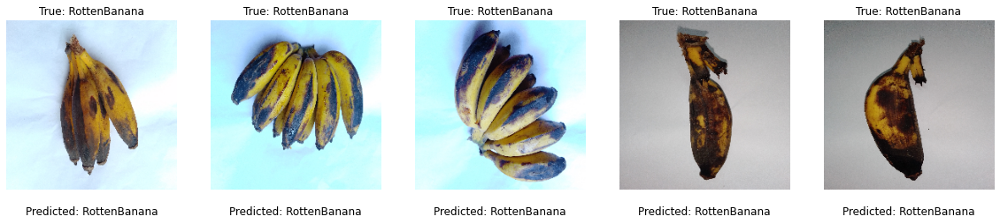

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGrape


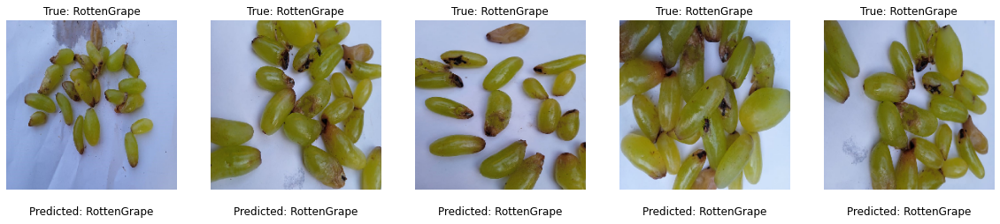

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGuava


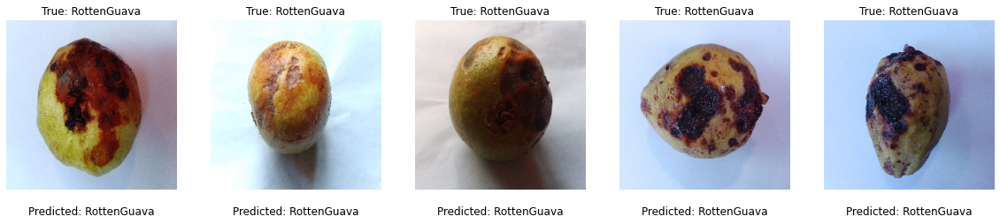

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenJujube


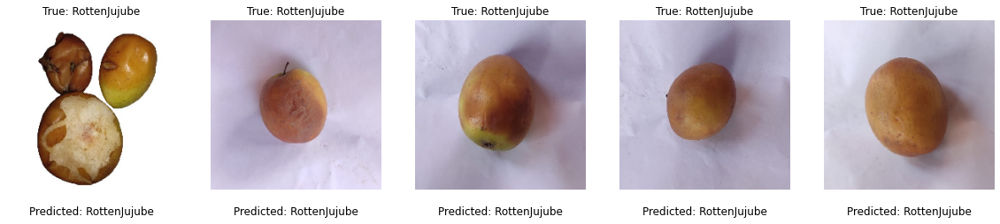

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenOrange


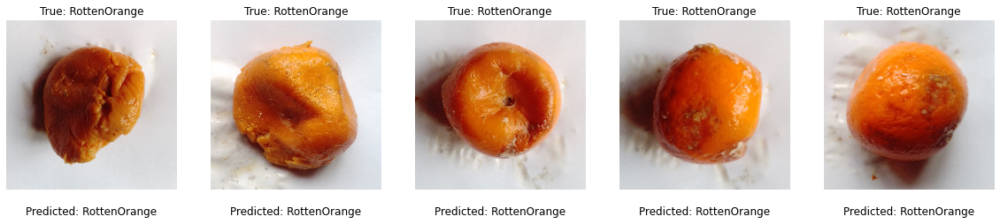

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenPomegranate


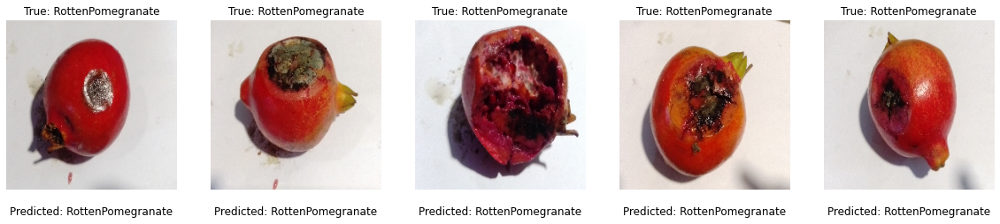

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenStrawberry


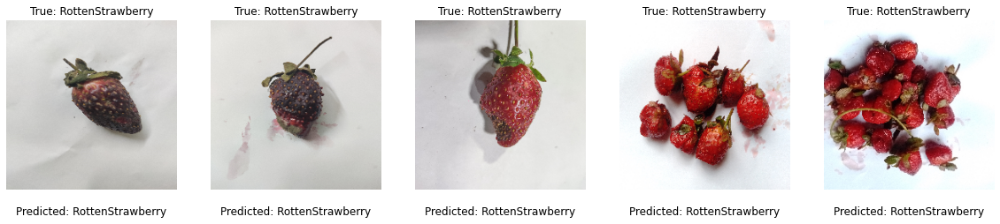

-------------------------------------------------------------------------------------------------------------------------------------------------------------


In [109]:
for k in range(16):
  print(labels[k])
  fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))

  # loop over the subplots and display each image with its true and predicted labels
  for i, ax in enumerate(axes):
      # display the image
      ax.imshow(list_true_categorical[k][i])
      
      # set the title to the true label
      ax.set_title('True: ' + labels[k])
      
      # add the predicted label below the image
      ax.text(0.5, -0.15, 'Predicted: ' + list_predict_categorical[k][i], transform=ax.transAxes, fontsize=12, ha='center')
      
      # turn off the x and y axes
      ax.axis('off')
  plt.show()
  print('-------------------------------------------------------------------------------------------------------------------------------------------------------------')

**False Predict**

In [122]:
labels = [label for label in lst_label]
list_false_categorical = []
list_false_predict_categorical = []
for label in labels:
  false_categorical = false_predict_img[true_false_predict_label == label]
  false_predict_categorical = false_predict_label[true_false_predict_label == label]

  list_false_categorical.append(false_categorical)
  list_false_predict_categorical.append(false_predict_categorical)

FreshApple


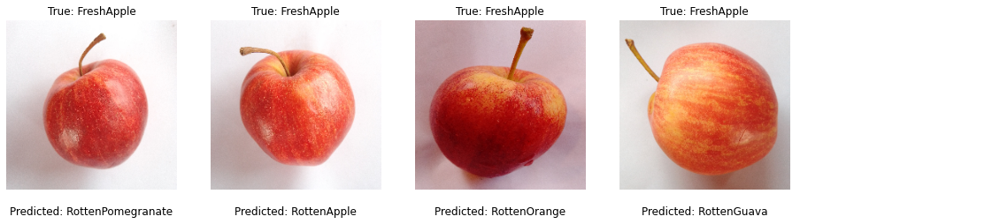

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshBanana


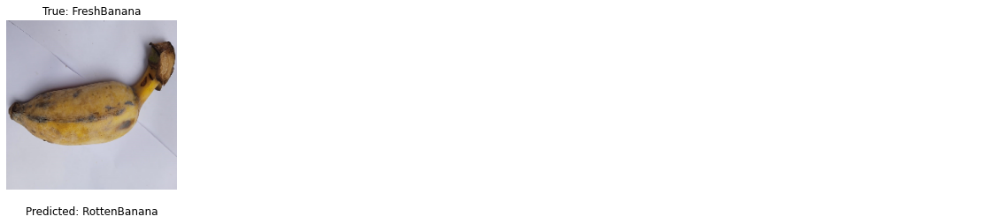

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGrape


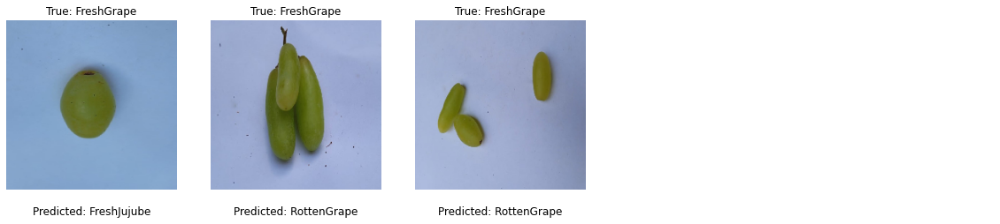

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGuava


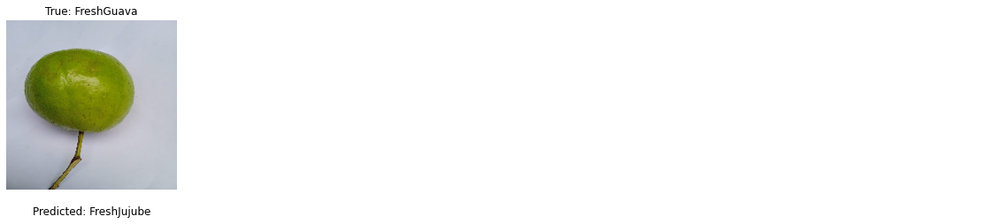

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshJujube


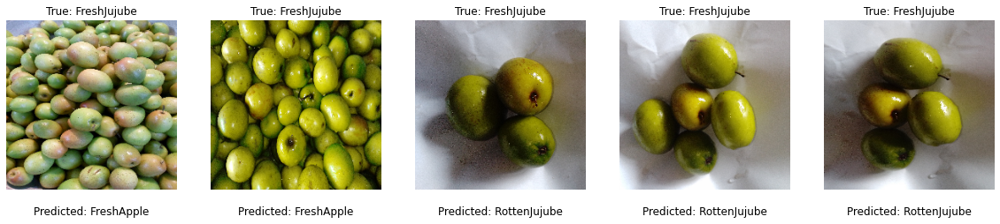

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshOrange


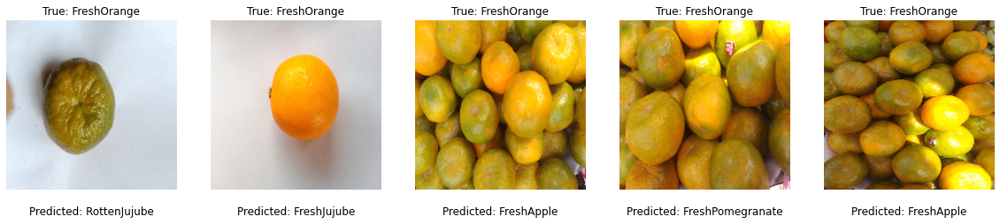

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshPomegranate


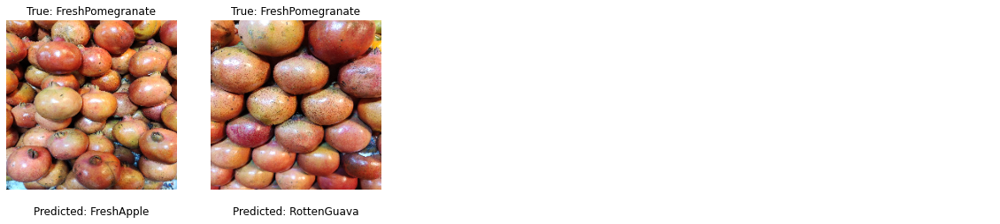

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshStrawberry


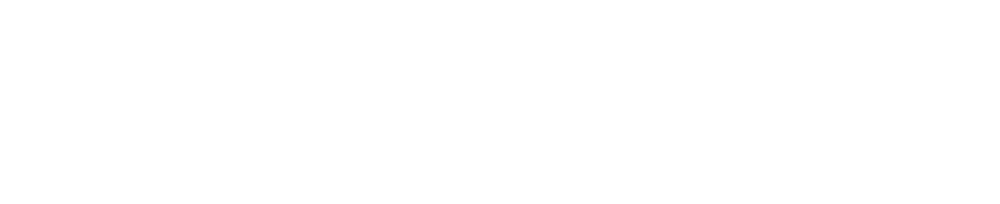

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenApple


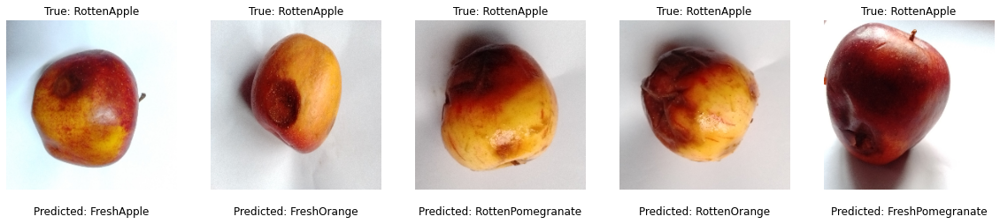

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenBanana


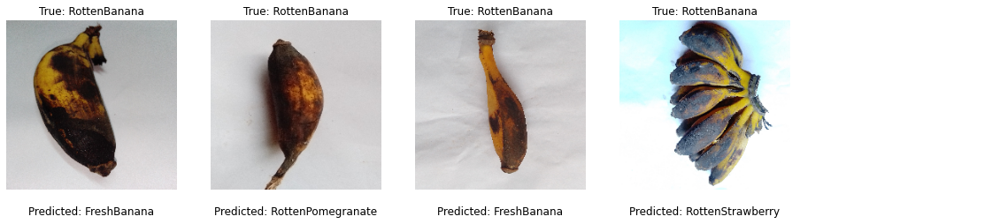

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGrape


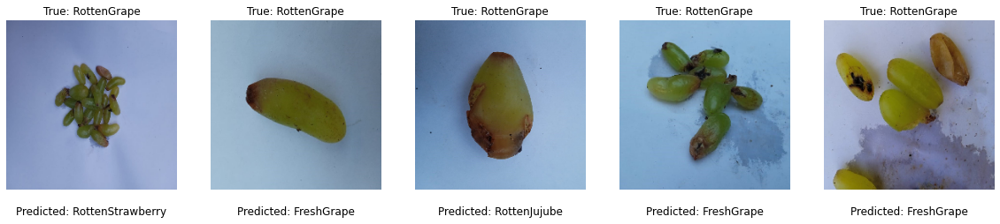

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGuava


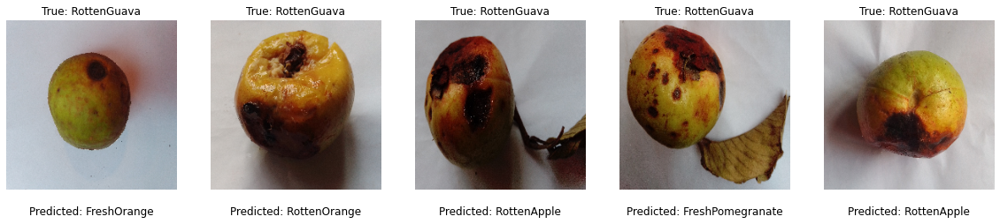

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenJujube


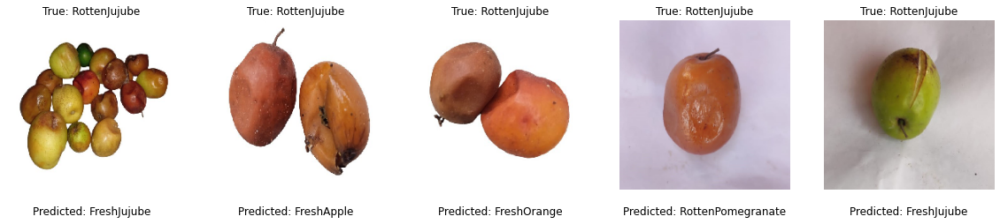

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenOrange


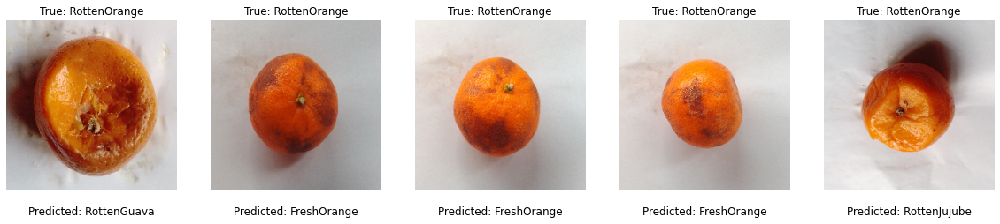

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenPomegranate


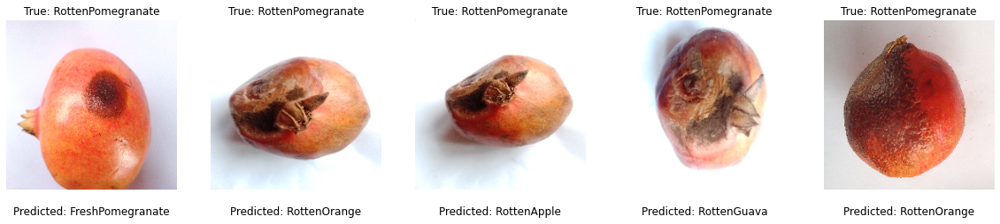

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenStrawberry


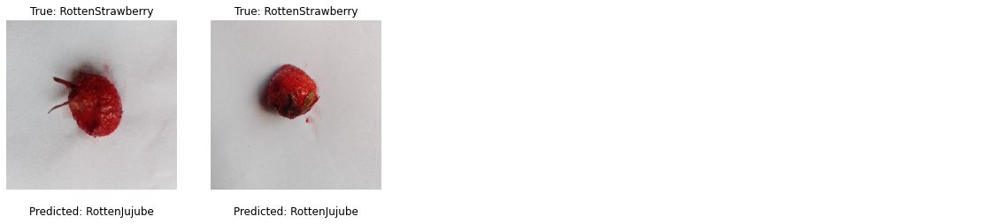

-------------------------------------------------------------------------------------------------------------------------------------------------------------


In [123]:
for k in range(16):
  print(labels[k])
  fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))

  # loop over the subplots and display each image with its true and predicted labels
  for i, ax in enumerate(axes):
      # display the image
      ax.axis('off')
      if i >= len(list_false_categorical[k]):
        continue
      ax.imshow(list_false_categorical[k][i])
      
      # set the title to the true label
      ax.set_title('True: ' + labels[k])
      
      # add the predicted label below the image
      ax.text(0.5, -0.15, 'Predicted: ' + list_false_predict_categorical[k][i], transform=ax.transAxes, fontsize=12, ha='center')
      
  plt.show()
  print('-------------------------------------------------------------------------------------------------------------------------------------------------------------')

## Load model

In [8]:
model = load_model('fruit_classifier_VGG16_original.h5')

In [9]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 16)                4112      
                                                                 
Total params: 21,141,584
Trainable params: 6,426,896
Non-trai

# VGG16 with preprocess data

## Train model

**Load pre-train model**

In [ ]:
from tensorflow import keras

base_model = keras.applications.VGG16(
    weights='imagenet',
    input_shape=(224, 224, 3),
    include_top=False)

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
# Keep the learned features intact and not modify them while training the new layers that were added on top of them
base_model.trainable = False

In [ ]:
# Create inputs with correct shape
inputs = Input(shape=(224, 224, 3))

x = base_model(inputs, training=False)

# Add pooling layer or flatten layer
x = Flatten()(x)

# Add a hidden layer
x = Dense(256, activation='relu')(x)

# Add a dropout layer
x = Dropout(.5)(x)

# Add final dense layer
outputs = Dense(16, activation = 'softmax')(x)

# Combine inputs and outputs to create model
model = Model(inputs, outputs)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 16)                4112      
                                                                 
Total params: 21,141,584
Trainable params: 6,426,896
Non-trai

In [ ]:
model.compile(loss='categorical_crossentropy',
              metrics=["accuracy"],
             optimizer = 'nadam')

In [ ]:
history = model.fit_generator(generator = train_it,
                              steps_per_epoch=train_it.samples/train_it.batch_size,
                              epochs=20,
                              validation_data=val_it,
                              validation_steps=test_it.samples/test_it.batch_size,
)

<ipython-input-12-e564f3ff746b>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator = train_it,


Epoch 1/20
480/480 [==============================] - ETA: 0s - loss: 1.2491 - accuracy: 0.5814

480/480 [==============================] - 5565s 12s/step - loss: 1.2491 - accuracy: 0.5814 - val_loss: 0.4843 - val_accuracy: 0.8443
Epoch 2/20
480/480 [==============================] - 1233s 3s/step - loss: 0.6598 - accuracy: 0.7671
Epoch 3/20
480/480 [==============================] - 1225s 3s/step - loss: 0.5150 - accuracy: 0.8178
Epoch 4/20
480/480 [==============================] - 1228s 3s/step - loss: 0.4385 - accuracy: 0.8447
Epoch 5/20
480/480 [==============================] - 1236s 3s/step - loss: 0.3746 - accuracy: 0.8622
Epoch 6/20
  6/480 [..............................] - ETA: 20:22 - loss: 0.3959 - accuracy: 0.8646

KeyboardInterrupt: ignored

**Save Model**

In [ ]:
model.save('fruit_classifier_VGG16.h5')

## Evaluate Model

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'upper left')

NameError: ignored

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper left')

In [ ]:
model.evaluate(test_it_original, steps=test_it_original.samples/test_it_original.batch_size)

40/40 [==============================] - 106s 3s/step - loss: 0.0554 - accuracy: 0.9844


[0.05544281005859375, 0.984375]

In [125]:
test_path = "Data/Split Original/test"
labels = os.listdir(test_path)
label_map = dict((v,k) for k,v in test_it_original.class_indices.items()) 
lst_imgs = {'img': [],'true': [], 'predict': []}

for label in labels:
  img_path = os.path.join(test_path,label)
  for img_name in os.listdir(img_path):

    # Load the image to be predicted
    img = image.load_img(os.path.join(img_path,img_name), target_size=(224, 224),color_mode = 'rgb')

    # Convert the image to a numpy array
    img_array = image.img_to_array(img)

    # Preprocess the image (normalize pixel values and expand dimensions to match input shape)
    img_preprocessed = np.expand_dims(img_array / 255.0, axis=0)

    predict = model.predict(img_preprocessed,verbose = 0)
    predict = label_map[np.argmax(predict)]
    lst_imgs['img'].append(img)
    lst_imgs['true'].append(label)
    lst_imgs['predict'].append(predict)


In [126]:
from sklearn.metrics import classification_report
lst_label = list(label_map.values())

clr_table = classification_report(lst_imgs['true'], lst_imgs['predict'], labels = lst_label)
print(clr_table)

                   precision    recall  f1-score   support

       FreshApple       0.99      1.00      0.99        80
      FreshBanana       1.00      1.00      1.00        80
       FreshGrape       1.00      0.94      0.97        80
       FreshGuava       1.00      1.00      1.00        80
      FreshJujube       0.92      1.00      0.96        80
      FreshOrange       1.00      0.99      0.99        80
 FreshPomegranate       1.00      1.00      1.00        80
  FreshStrawberry       1.00      1.00      1.00        80
      RottenApple       0.98      0.99      0.98        80
     RottenBanana       1.00      0.99      0.99        80
      RottenGrape       0.96      1.00      0.98        80
      RottenGuava       0.97      0.97      0.97        80
     RottenJujube       1.00      0.91      0.95        80
     RottenOrange       0.96      1.00      0.98        80
RottenPomegranate       0.97      0.96      0.97        80
 RottenStrawberry       1.00      1.00      1.00       

In [127]:
imgs = np.array(lst_imgs['img'])
y_predict = np.array(lst_imgs['predict'])
y_true = np.array(lst_imgs['true'])

<ipython-input-127-e2d7e8e55382>:1: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  imgs = np.array(lst_imgs['img'])
<ipython-input-127-e2d7e8e55382>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  imgs = np.array(lst_imgs['img'])


In [128]:
true_predict_img = imgs[y_predict == y_true]
true_predict_label = y_true[y_predict == y_true]
false_predict_img = imgs[~(y_predict == y_true)]
false_predict_label = y_predict[~(y_predict == y_true)]
true_false_predict_label = y_true[~(y_predict == y_true)]

**True Predict**

In [129]:
labels = [label for label in lst_label]
list_true_categorical = []
list_predict_categorical = []
for label in labels:
  true_categorical = true_predict_img[true_predict_label == label]
  predict_categorical = true_predict_label[true_predict_label == label]

  list_true_categorical.append(true_categorical)
  list_predict_categorical.append(predict_categorical)

FreshApple


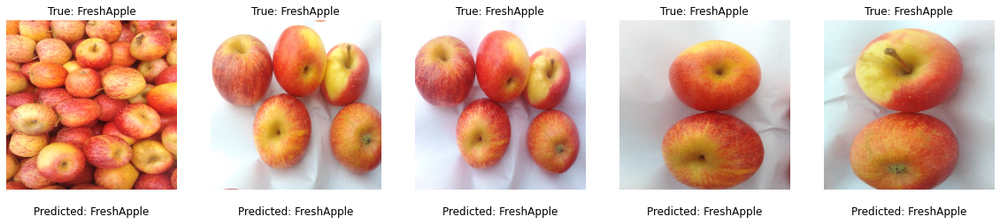

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshBanana


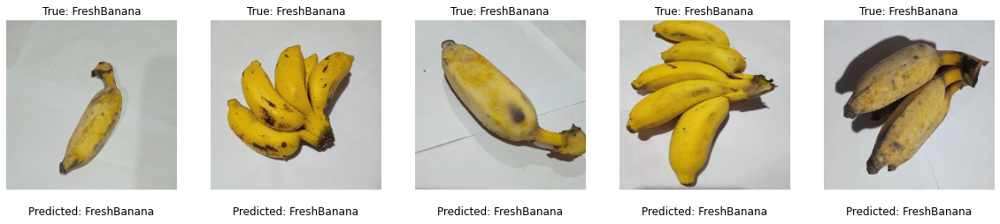

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGrape


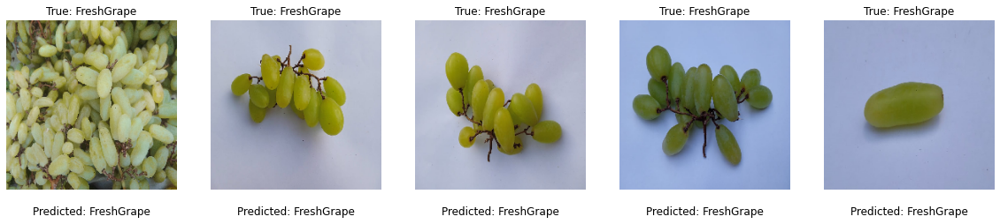

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGuava


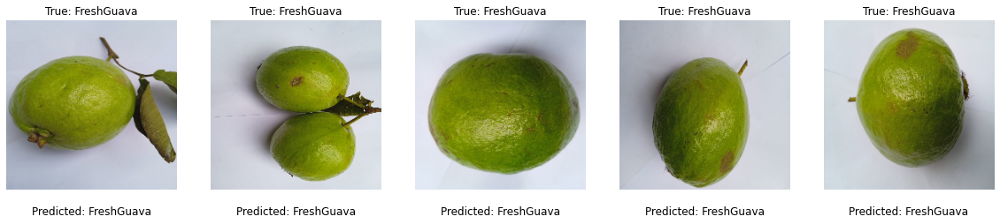

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshJujube


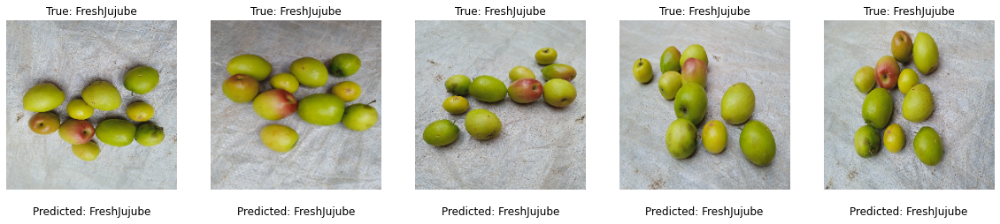

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshOrange


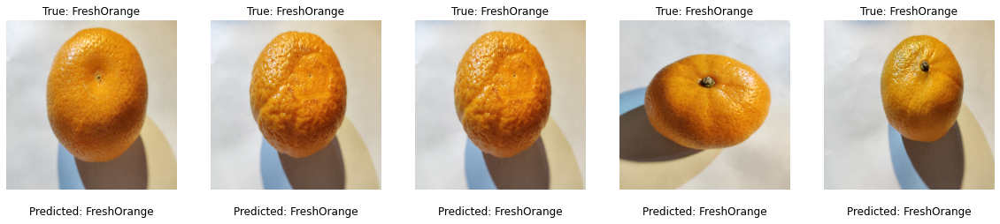

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshPomegranate


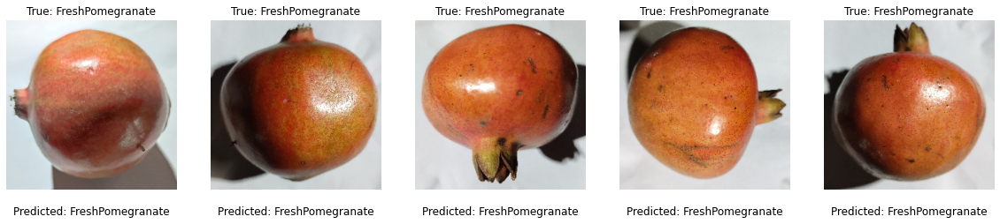

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshStrawberry


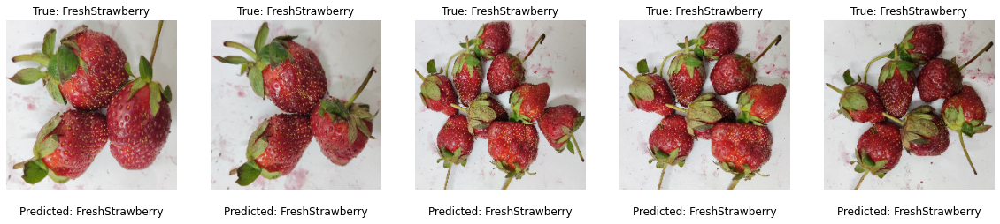

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenApple


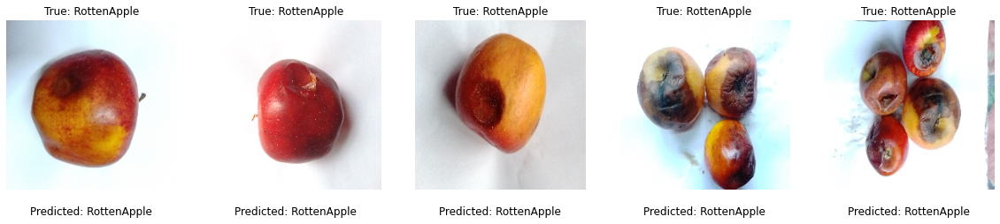

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenBanana


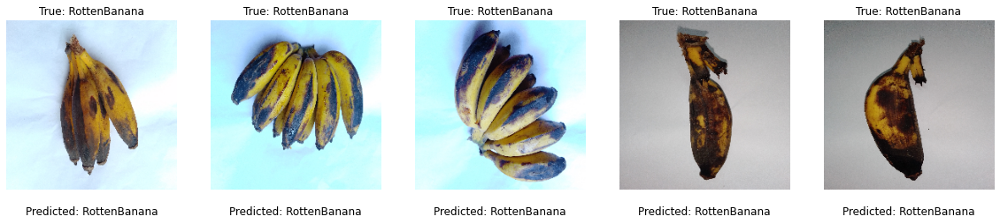

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGrape


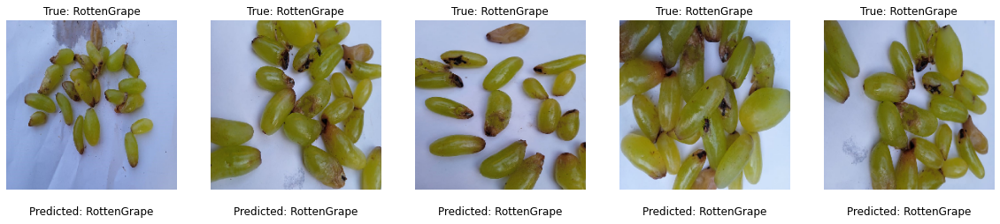

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGuava


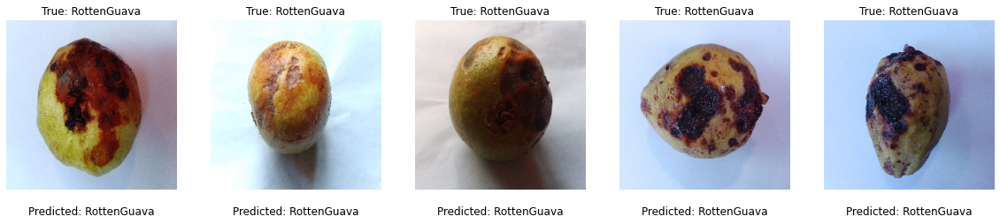

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenJujube


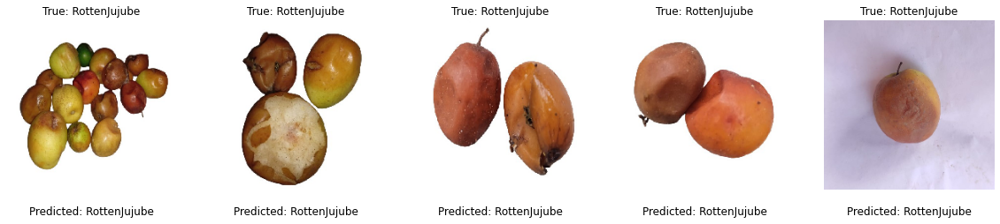

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenOrange


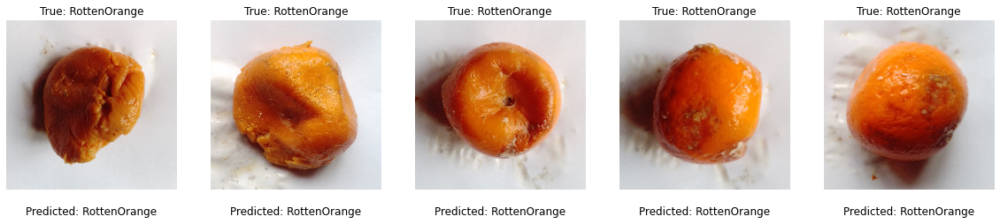

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenPomegranate


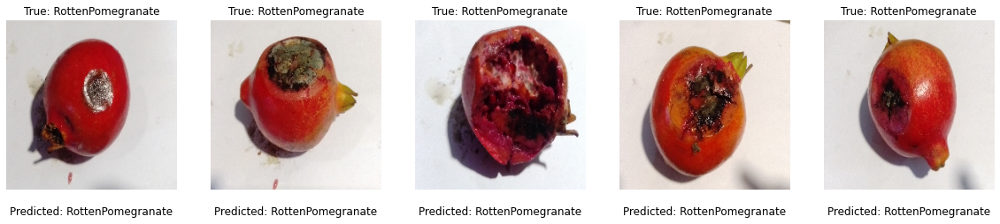

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenStrawberry


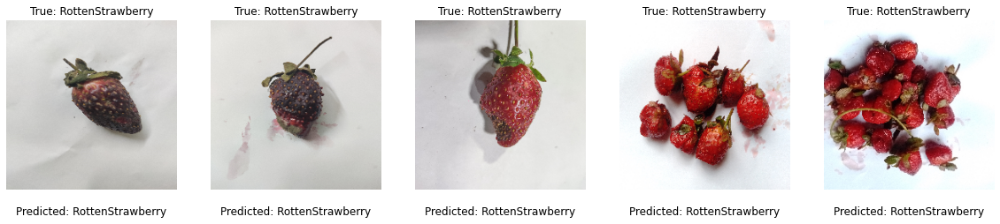

-------------------------------------------------------------------------------------------------------------------------------------------------------------


In [130]:
for k in range(16):
  print(labels[k])
  fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))

  # loop over the subplots and display each image with its true and predicted labels
  for i, ax in enumerate(axes):
      # display the image
      ax.imshow(list_true_categorical[k][i])
      
      # set the title to the true label
      ax.set_title('True: ' + labels[k])
      
      # add the predicted label below the image
      ax.text(0.5, -0.15, 'Predicted: ' + list_predict_categorical[k][i], transform=ax.transAxes, fontsize=12, ha='center')
      
      # turn off the x and y axes
      ax.axis('off')
  plt.show()
  print('-------------------------------------------------------------------------------------------------------------------------------------------------------------')

**False Predict**

In [131]:
labels = [label for label in lst_label]
list_false_categorical = []
list_false_predict_categorical = []
for label in labels:
  false_categorical = false_predict_img[true_false_predict_label == label]
  false_predict_categorical = false_predict_label[true_false_predict_label == label]

  list_false_categorical.append(false_categorical)
  list_false_predict_categorical.append(false_predict_categorical)

FreshApple


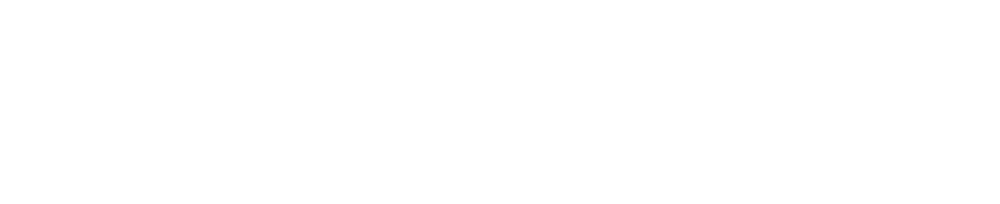

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshBanana


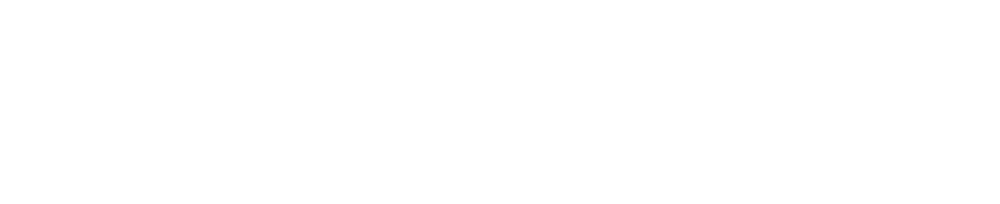

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGrape


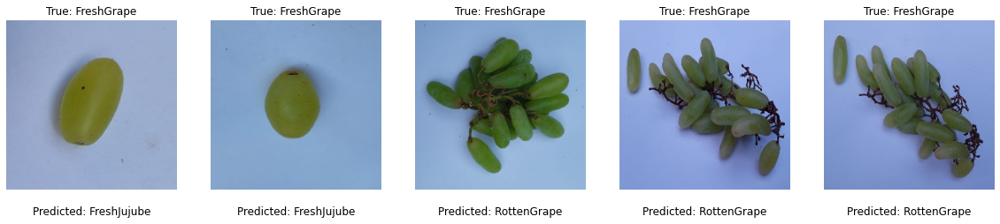

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshGuava


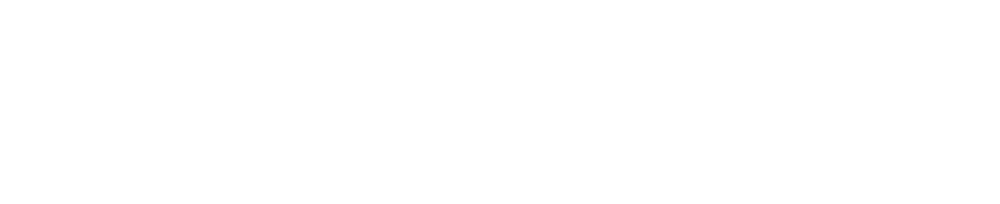

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshJujube


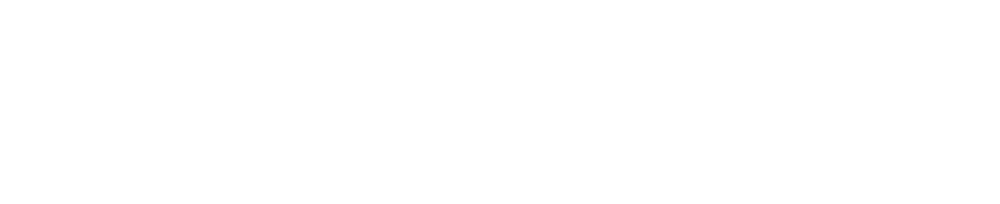

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshOrange


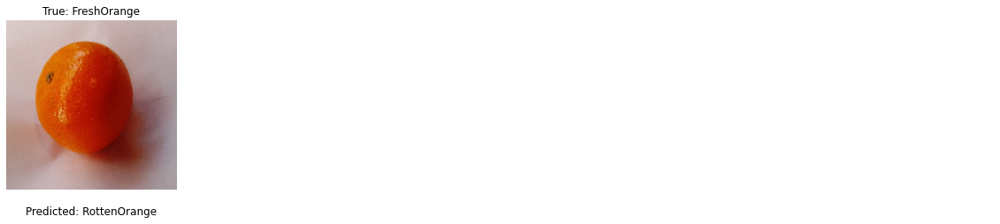

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshPomegranate


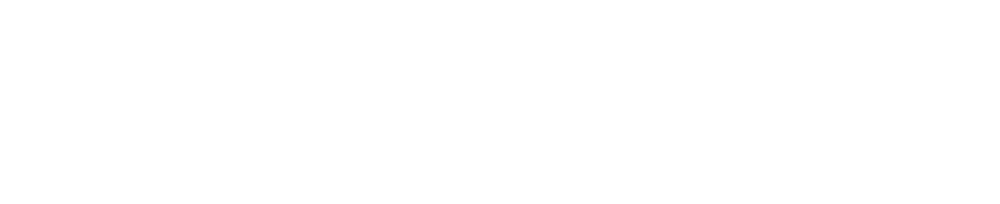

-------------------------------------------------------------------------------------------------------------------------------------------------------------
FreshStrawberry


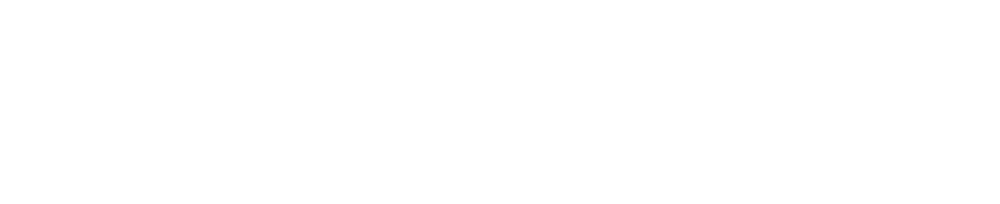

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenApple


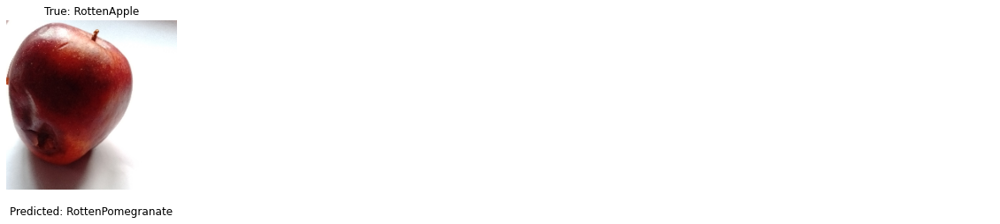

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenBanana


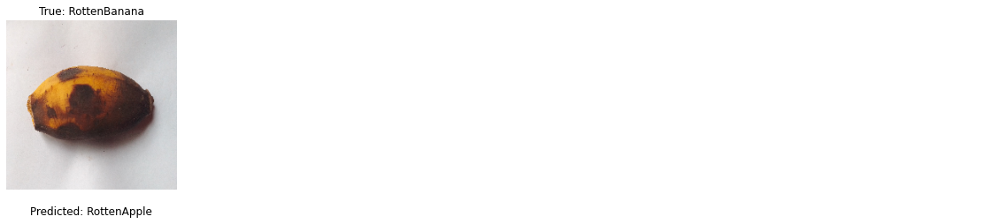

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGrape


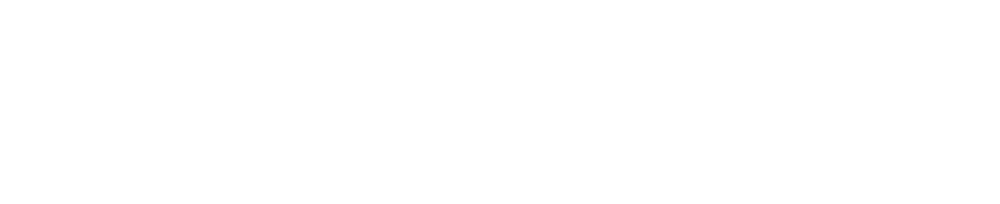

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenGuava


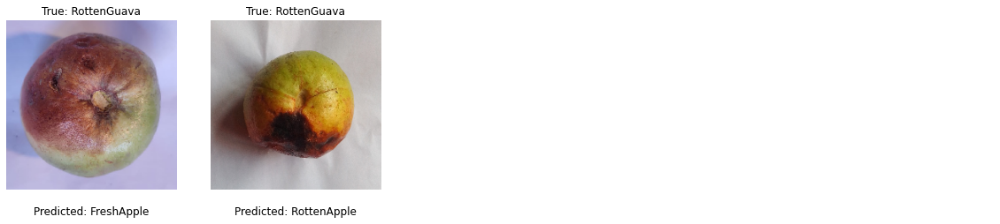

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenJujube


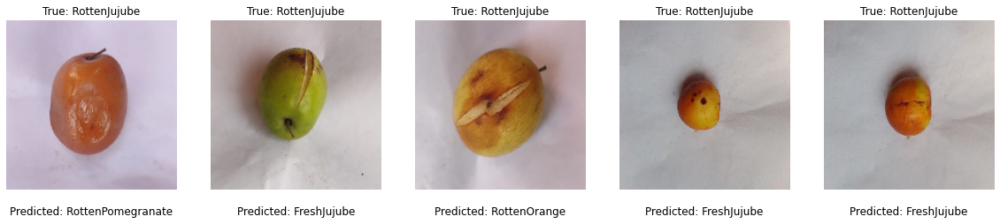

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenOrange


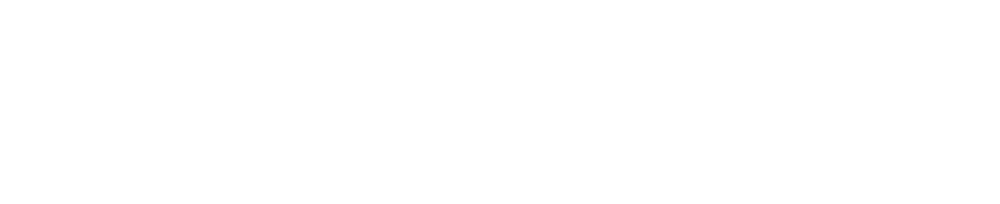

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenPomegranate


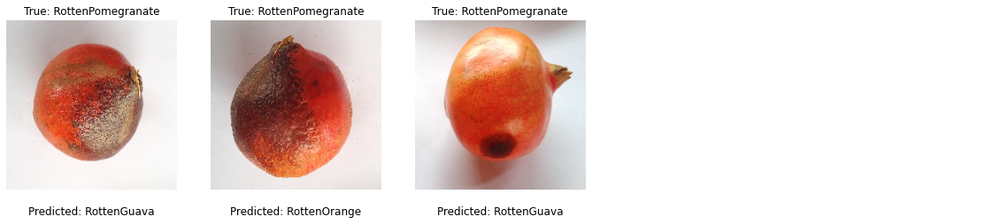

-------------------------------------------------------------------------------------------------------------------------------------------------------------
RottenStrawberry


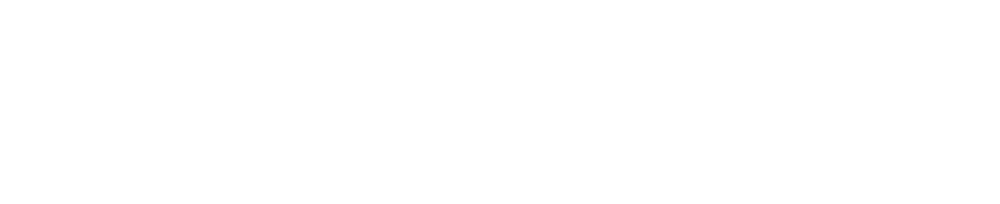

-------------------------------------------------------------------------------------------------------------------------------------------------------------


In [132]:
for k in range(16):
  print(labels[k])
  fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))

  # loop over the subplots and display each image with its true and predicted labels
  for i, ax in enumerate(axes):
      # display the image
      ax.axis('off')
      if i >= len(list_false_categorical[k]):
        continue
      ax.imshow(list_false_categorical[k][i])
      
      # set the title to the true label
      ax.set_title('True: ' + labels[k])
      
      # add the predicted label below the image
      ax.text(0.5, -0.15, 'Predicted: ' + list_false_predict_categorical[k][i], transform=ax.transAxes, fontsize=12, ha='center')
      
  plt.show()
  print('-------------------------------------------------------------------------------------------------------------------------------------------------------------')

## Load model

In [ ]:
cd "/content/gdrive/MyDrive/CS114-Minh thuận"

/content/gdrive/MyDrive/CS114-Minh thuận


In [124]:
model = load_model('fruit_classifier_VGG16.h5')

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 16)                4112      
                                                                 
Total params: 21,141,584
Trainable params: 6,426,896
Non-trai